# Part II - Effects of Loan Characteristics on Borrower's APR
## by Festus Sambu

## Investigation Overview


In this investigation, I wanted to look at the characteristics of loans that could be used to predict their borrower APR. The main focus was on the original loan amount, borrower's CreditScoreRating, loan term, borrower's loan Status.

## Dataset Overview

The loans dataset contains 113k+ Prosper loans from the period 2005-2014 and 81 variables. Prosper is a US peer-to-peer landing company founded in 2005, so the dataset covers the first years of their business. The data collection went through changes in 2009, which we kept in mind during the investigation.

In [1]:

# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_colwidth', None) # to display the whole strings and not collapse them
pd.set_option('display.max_columns', None) # to not collapse columns when viewing data
pd.set_option('display.max_rows', None) # to display all rows in the output

import warnings
warnings.filterwarnings("ignore") # warnings off

%matplotlib inline

plt.rcParams["figure.figsize"] = (20,3)

In [2]:
# load in the dataset into a pandas dataframe
df = pd.read_csv('Sampled Prosper Data.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33243 entries, 0 to 33242
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   LoanStatus                33243 non-null  object 
 1   Term                      33243 non-null  int64  
 2   LoanOriginalAmount        33243 non-null  int64  
 3   MonthlyLoanPayment        33243 non-null  float64
 4   ListingCategory           33243 non-null  int64  
 5   BorrowerAPR               33243 non-null  float64
 6   CreditScoreRangeLower     33242 non-null  float64
 7   IncomeRange               33243 non-null  object 
 8   IncomeVerifiable          33243 non-null  bool   
 9   StatedMonthlyIncome       33243 non-null  float64
 10  DebtToIncomeRatio         30683 non-null  float64
 11  EmploymentStatus          33243 non-null  object 
 12  EmploymentStatusDuration  31649 non-null  float64
 13  IsBorrowerHomeowner       33243 non-null  bool   
 14  Credit

In [4]:
# reduce no. of IncomeRange categories by 1
df.IncomeRange.replace({'$0': 'Not employed'}, inplace=True) 

# Convert CreditGrade,IncomeRange as ordered categorical vars
var_dict = {'CreditRiskScore': ['AA', 'A', 'B', 'C', 'D', 'E', 'HR', 'NC'],
           'IncomeRange': ['Not displayed', 'Not employed', '$1-24,999', 
                           '$25,000-49,999', '$50,000-74,999', '$75,000-99,999', '$100,000+']}
for var in var_dict:
    ordered_var = pd.api.types.CategoricalDtype(ordered=True, categories = var_dict[var])
    df[var] = df[var].astype(ordered_var)

#Capping outliers 
def cap_data(df):
    for col in df.columns:
        print("capping the ",col)
        if (((df[col].dtype)=='float64') | ((df[col].dtype)=='int64')):
            percentiles = df[col].quantile([0.01,0.99]).values
            df[col][df[col] <= percentiles[0]] = percentiles[0]
            df[col][df[col] >= percentiles[1]] = percentiles[1]
        else:
            df[col]=df[col]
    return df

final_df=cap_data(df)

capping the  LoanStatus
capping the  Term
capping the  LoanOriginalAmount
capping the  MonthlyLoanPayment
capping the  ListingCategory
capping the  BorrowerAPR
capping the  CreditScoreRangeLower
capping the  IncomeRange
capping the  IncomeVerifiable
capping the  StatedMonthlyIncome
capping the  DebtToIncomeRatio
capping the  EmploymentStatus
capping the  EmploymentStatusDuration
capping the  IsBorrowerHomeowner
capping the  CreditRiskScore
capping the  MonthsToClosed


In [5]:
final_df

,LoanStatus,Term,LoanOriginalAmount,MonthlyLoanPayment,ListingCategory,BorrowerAPR,CreditScoreRangeLower,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,DebtToIncomeRatio,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CreditRiskScore,MonthsToClosed
0,Current,36,20000,703.04,1,0.19645,740.0,"$25,000-49,999",True,2916.666667,0.78,Employed,414.0,False,B,NaN
1,Current,60,10000,253.66,1,0.20347,700.0,"$50,000-74,999",True,5884.083333,0.36,Employed,388.0,True,C,NaN
2,Completed,36,1200,45.44,1,0.23635,580.0,"$25,000-49,999",True,4041.666667,0.14,Full-time,2.0,True,E,10.817918
3,Current,36,7550,249.08,1,0.14348,760.0,"$50,000-74,999",True,5666.666667,0.10,Employed,2.0,True,A,NaN
4,Defaulted,36,5000,173.33,0,0.15713,640.0,"$25,000-49,999",True,3880.000000,0.07,Full-time,69.0,False,C,28.391151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33238,Current,60,9000,232.23,1,0.21192,660.0,"$50,000-74,999",True,4583.333333,0.08,Employed,1.0,False,C,NaN
33239,Completed,36,8500,275.63,8,0.13138,760.0,"$75,000-99,999",True,6250.000000,0.24,Employed,147.0,True,A,8.628991
33240,Current,36,4000,135.84,1,0.17151,680.0,"$25,000-49,999",True,2500.000000,0.22,Employed,39.0,False,B,NaN
33241,Current,36,10000,400.35,1,0.29394,680.0,"$50,000-74,999",False,5000.000000,NaN,Employed,121.0,False,D,NaN


> Note that the above cells have been set as "Skip"-type slides. That means
that when the notebook is rendered as http slides, those cells won't show up.

Distribution of Borrower APR

The distribution of APR looks multimodal. A small peak centered at 0.1, a large peak centered at 0.2. There is also a small peak centered 0.3. Additionally, there is a very shape peak between 0.35 and 0.36. Only very few loans have APR greater than 0.43.

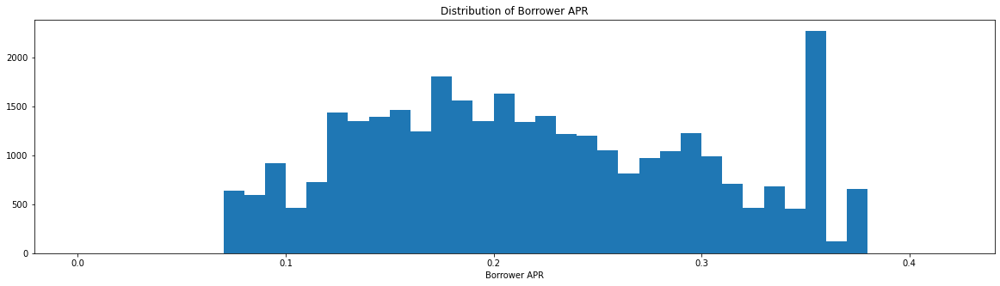

In [6]:
bins = np.arange(0, final_df.BorrowerAPR.max()+0.05, 0.01)
plt.figure(figsize=[20, 5])
plt.hist(data = final_df, x = 'BorrowerAPR', bins = bins);
plt.xlabel('Borrower APR');
plt.title('Distribution of Borrower APR');

## Borrower's APR vs (Loan Original Amount, MonthlyLoanPayment, CreditScoreRangeLower)

Borrower's APR tend to have a negative correlation with Loan Original Amount, MonthlyLoanPayment, CreditScoreRangeLower variables 

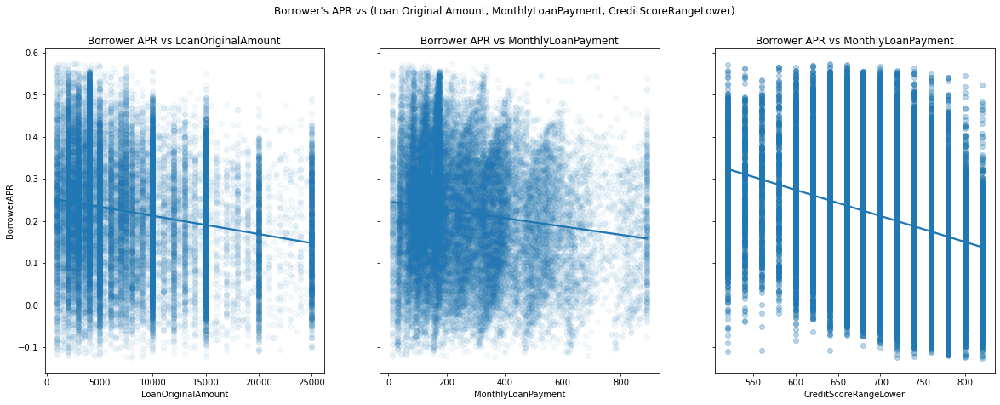

In [7]:
# Create two subplots and unpack the output array immediately
f, axes = plt.subplots(1, 3, sharey=True, figsize=(20, 7))

plt.suptitle("Borrower's APR vs (Loan Original Amount, MonthlyLoanPayment, CreditScoreRangeLower)");

sns.regplot(data = final_df, ax = axes[0], x = df['LoanOriginalAmount'], y = df.BorrowerAPR, scatter_kws={'alpha':0.05}, y_jitter = 0.2);
axes[0].set_title('Borrower APR vs LoanOriginalAmount');
sns.regplot(data = final_df, ax = axes[1], x = df['MonthlyLoanPayment'], y = df.BorrowerAPR, scatter_kws={'alpha':0.05}, y_jitter = 0.2);
axes[1].set_title('Borrower APR vs MonthlyLoanPayment');
axes[1].set(ylabel=None);
sns.regplot(data = final_df, ax = axes[2], x = df['CreditScoreRangeLower'], y = df.BorrowerAPR, scatter_kws={'alpha':0.3}, y_jitter = 0.2);
axes[2].set_title('Borrower APR vs MonthlyLoanPayment');
axes[2].set(ylabel=None);


## Borrower APR vs. CreditRiskScore
The borrower APR tend to increase with the increasingly better creditriskscore. Borrowers with the best Scores have the lowest APR. This shows that AA is the best creditRiskScore Group

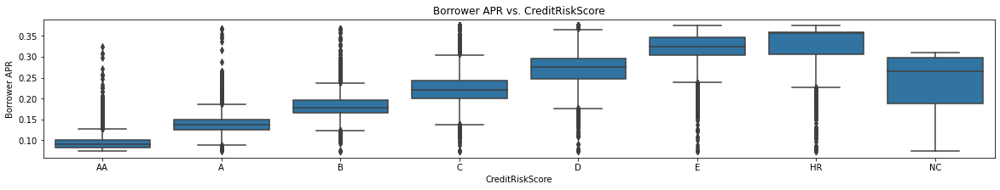

In [8]:
default_color = sns.color_palette()[0]
sns.boxplot(data=final_df, x='CreditRiskScore', y='BorrowerAPR', color=default_color)
plt.xlabel('CreditRiskScore')
plt.ylabel('Borrower APR')
plt.title('Borrower APR vs. CreditRiskScore');

## Borrower APR by CreditRiskScore and Term

Interestingly, the borrower APR decrease with the increase of borrow term for people with HR-C raings. But for people with B-AA ratings, the APR increase with the increase of borrow term.



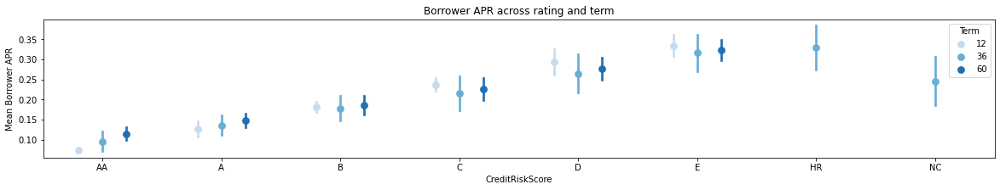

In [9]:
ax = sns.pointplot(data = final_df, x = 'CreditRiskScore', y = 'BorrowerAPR', hue = 'Term',
           palette = 'Blues', linestyles = '', dodge = 0.4, ci='sd')
plt.title('Borrower APR across rating and term')
plt.ylabel('Mean Borrower APR')
ax.set_yticklabels([],minor = True);

In [10]:
!jupyter nbconvert Part_II_ProsperLoanData.ipynb --to slides --post serve --no-input --no-prompt

^C
